In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
from matplotlib.pyplot import figure

from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})

hfont = {'fontname':'Arial'}
import plotly.express as px
import plotly.graph_objects as go
from matplotlib.ticker import ScalarFormatter
import matplotlib.ticker as ticker

import os
import sys
sys.path.append(os.path.abspath('..'))

import matplotlib.animation as animation
from matplotlib.animation import PillowWriter
import random
np.random.seed(4)
pd.set_option('display.max_columns', None)
from matplotlib.ticker import FuncFormatter

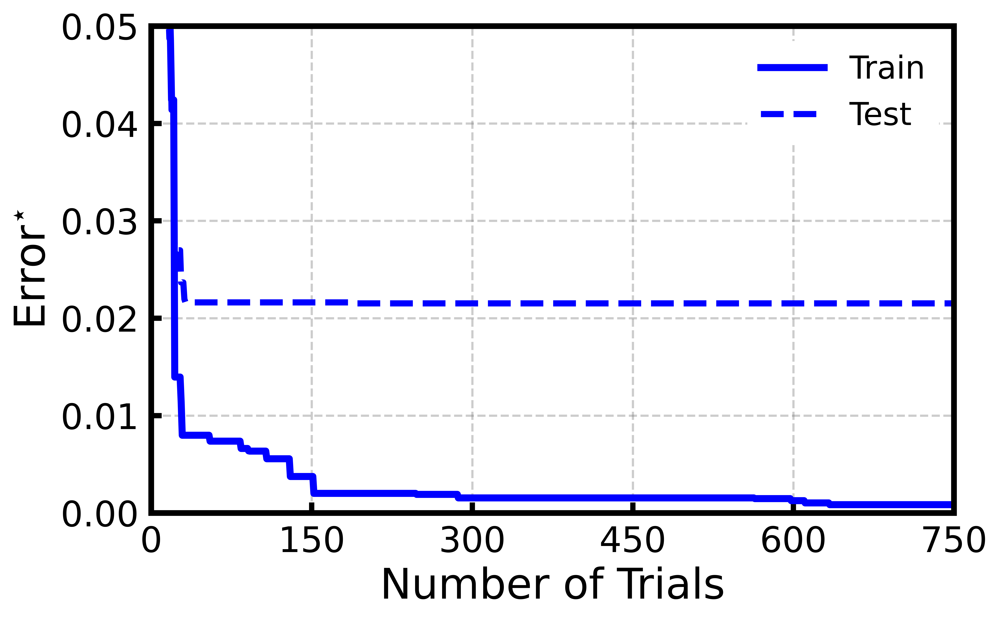

In [2]:
df_trials = pd.read_csv("./HEMT_EX/Final_Results_Paper/val_ex/optuna_trials_10000_singleobj_glitched.csv")
train_error_id = np.array(df_trials['train_error_id'])
test_error_id = np.array(df_trials['test_error_id'])

def make_array_decreasing(arr):
    return np.minimum.accumulate(arr)

train_error = make_array_decreasing(train_error_id)
test_error = make_array_decreasing(test_error_id)
num_trials = np.arange(1, 1001)

fig, ax = plt.subplots(dpi=1000)

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)

plt.plot(num_trials, train_error, color='blue', linewidth=4)
plt.plot(num_trials, test_error, color='blue', linewidth=3.5, linestyle='--')

ax.set_xlim([0, 750])  
ax.set_ylim([0, 0.05])  

x_ticks = np.arange(0, 900, 150)

ax.set_xticks(x_ticks)

ax.set_xlabel('Number of Trials', fontsize=24, color='black')
ax.set_ylabel(r'Error$^{\star}$', fontsize=24, color='black')

ax.legend(['Train', 'Test'], fontsize=18, loc='upper right', framealpha=1, facecolor='white', edgecolor='white')

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)

ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, colors='black', zorder=0)
plt.tick_params(axis='both', which='major', pad=7) # Adjust pad for more space

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()
# fig.savefig("Fig_1.pdf", format='pdf', bbox_inches='tight')

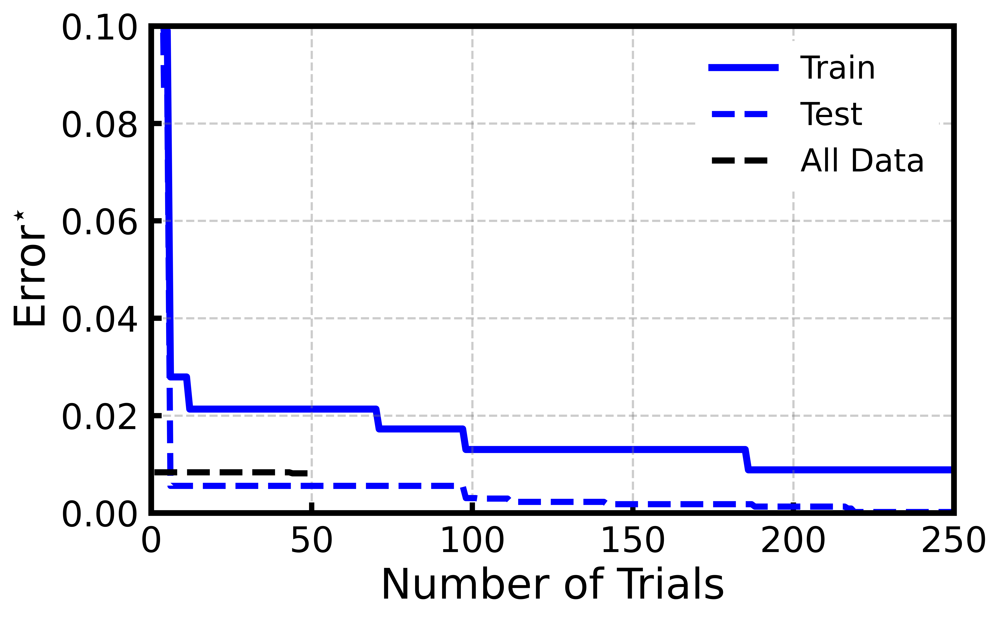

In [3]:
df_trials = pd.read_csv("./Diode_ex/Final_Results_Paper/Clipped_Train_Val_Split/diamond_diode_Optuna_250_trials_train_val_split.csv")
train_error = np.array(df_trials['Train Error'])
test_error = np.array(df_trials['Test Error'])

df_trials_all = pd.read_csv("./Diode_ex/Final_Results_Paper/Clipped_All_Data/diamond_diode_Optuna_250_trials_all_data.csv")
total_error = np.array(df_trials_all['Error'])

def make_array_decreasing(arr):
    return np.minimum.accumulate(arr)

train_error = make_array_decreasing(train_error)
test_error = make_array_decreasing(test_error)

total_error = make_array_decreasing(total_error)

num_trials = np.arange(1, 251)
num_trials_all_data = np.arange(1, 51)

fig, ax = plt.subplots(dpi=1000)

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)

plt.plot(num_trials, train_error, color='blue', linewidth=4, linestyle='-', zorder=1)
plt.plot(num_trials, test_error, color='blue', linewidth=3.5, linestyle='--', zorder=2)
plt.plot(num_trials_all_data, total_error, color='black', linewidth=3.5, linestyle='--', zorder=2)

ax.set_xlim([0, 250])  
ax.set_ylim([0, 0.1])  

ax.set_xlabel('Number of Trials', fontsize=24, color='black')
ax.set_ylabel(r'Error$^{\star}$', fontsize=24, color='black')

ax.legend(['Train', 'Test', 'All Data'], fontsize=18, loc='best', framealpha=1, facecolor='white', edgecolor='white')

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)

ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, colors='black', zorder=0)
plt.tick_params(axis='both', which='major', pad=7) # Adjust pad for more space

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()
# fig.savefig("Fig_2.pdf", format='pdf', bbox_inches='tight')

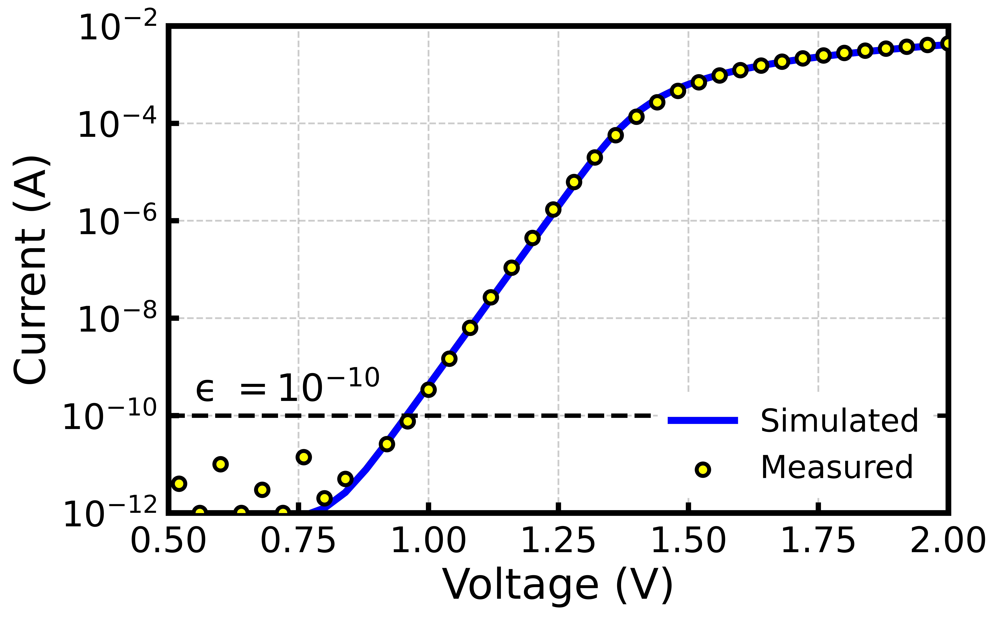

In [4]:
df_diode_meas = pd.read_csv("./Diode_ex/Final_Results_Paper/Clipped_All_Data/diamond_diode_meas.csv")
va_meas = np.array(df_diode_meas['va_meas'])
ia_meas = np.array(df_diode_meas['ia_meas'])

df_diode_sim = pd.read_csv("./Diode_ex/Final_Results_Paper/Clipped_All_Data/diamond_diode_sim.csv")
va_sim = np.array(df_diode_sim['va_sim'])
ia_sim = np.array(df_diode_sim['ia_sim'])

fig, ax = plt.subplots(dpi=1000)

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1, zorder=0, alpha=0.4)

ax.scatter(va_meas, abs(ia_meas), color='yellow', edgecolor='black', s=50, linewidth=2.25, zorder=3, label='Measured')
plt.semilogy(va_sim, ia_sim, color='blue', linestyle='-', linewidth=4, zorder=2, label='Simulated')

x = [0.5, 2]  
y = [10**-10, 10**-10]   
plt.semilogy(x, y, color='black', linewidth=2.5, linestyle='--') 

plt.text(0.55, 2e-10, r'ϵ $= 10^{-10}$', fontsize=21.5, color='black')


ax.set_xlim([0.5, 2])  
ax.set_ylim([10**-12, 10**-2])  

ax.set_xlabel('Voltage (V)', fontsize=24, color='black')
ax.set_ylabel(r'Current (A)', fontsize=24, color='black')

ax.legend(fontsize=18, loc='lower right', framealpha=1, facecolor='white', edgecolor='white')

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)

ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, colors='black', zorder=0)
plt.tick_params(axis='both', which='major', pad=7) # Adjust pad for more space

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()
# fig.savefig("Fig_3.pdf", format='pdf', bbox_inches='tight')


In [5]:
df_diode_meas = pd.read_csv("./Diode_ex/Final_Results_Paper/Clipped_All_Data/diamond_diode_meas.csv")
va_meas = np.array(df_diode_meas['va_meas'])
ia_meas = np.array(df_diode_meas['ia_meas'])

df_diode_sim = pd.read_csv("./Diode_ex/Final_Results_Paper/Clipped_All_Data/diamond_diode_sim.csv")
va_sim = np.array(df_diode_sim['va_sim'])
ia_sim = np.array(df_diode_sim['ia_sim'])


indices_ia = np.where(ia_meas < 1e-10)[0]

ia_meas = np.delete(ia_meas, indices_ia)
ia_sim = np.delete(ia_sim, indices_ia)

epsilon = 1e-10
delta = np.sqrt(0.15)

def calc_error_robust(ia_meas, ia_sim, epsilon, delta):
    ia_meas = np.maximum(ia_meas, -epsilon + 1e-15)
    ia_sim = np.maximum(ia_sim, -epsilon + 1e-15)
    log_I_meas = np.log(1 + ia_meas/epsilon)
    log_I_sim = np.log(1 + ia_sim/epsilon)
    error = np.abs(log_I_meas - log_I_sim)
    penalized_errors = np.where(error <= delta, error**2, delta**2)
    return np.mean(penalized_errors)

error_ia = calc_error_robust(ia_meas, ia_sim, epsilon, delta)

print('The error for ia for values greater than 1e-10 is:' + ' ' + str(error_ia))


The error for ia for values greater than 1e-10 is: 0.009911961609816923


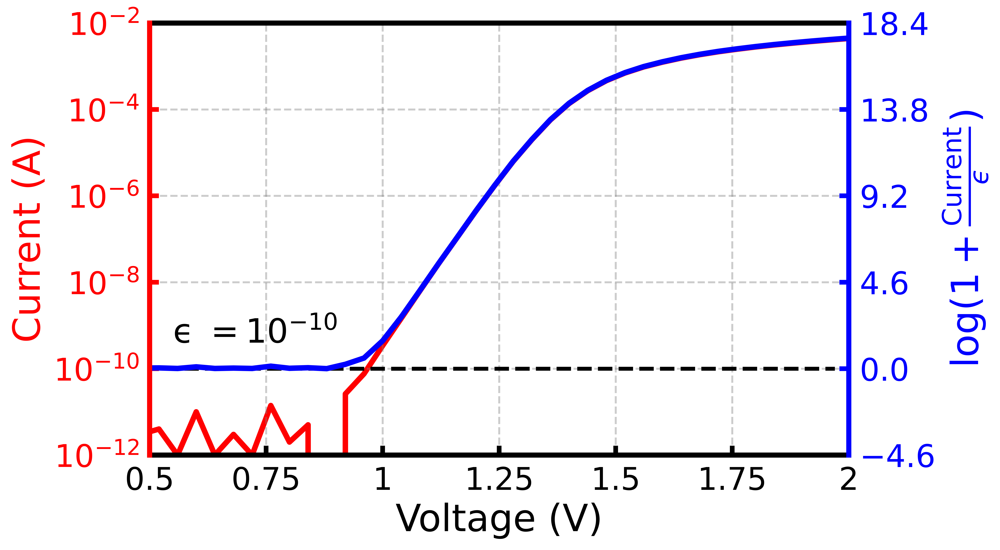

In [6]:
df_diode_meas = pd.read_csv("./Diode_ex/Final_Results_Paper/Clipped_All_Data/diamond_diode_meas.csv")
va_meas = np.array(df_diode_meas['va_meas'])
ia_meas = np.array(df_diode_meas['ia_meas'])

fig, ax1 = plt.subplots(dpi=1000)
plt.rcParams['font.family'] = 'Dejavu Sans'

ax1.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)


ax1.plot(va_meas, abs(ia_meas), color='red', linewidth=3.5, zorder=1)
ax1.set_yscale('log')

ax2 = ax1.twinx()


ax2.plot(va_meas, np.log(1 + abs(ia_meas)/1e-10), color='blue', linewidth=3.5, zorder=1)

x = [0.53, 1.97]  
y = [0, 0]   

ax2.plot(x, y, color='black', linewidth=2.5, linestyle='--', zorder=0) 

ax1.text(0.55, 4e-10, r'ϵ $= 10^{-10}$', fontsize=21.5, color='black')

ax1.set_xlim([0.5, 2])  

ax1.set_ylim([10**-12, 10**-2])  
ax2.set_ylim([-4.6, 18.4])  

x_ticks = np.arange(0.5, 2.25, 0.25)
ax1.set_xticks(x_ticks)
ax1.set_yticks([10**-12, 10**-10, 10**-8, 10**-6, 10**-4, 10**-2])
ax2.set_yticks([-4.6, 0, 4.6, 9.2, 13.8, 18.4])

# Setting labels
ax1.set_xlabel('Voltage (V)', fontsize=24, color='black')
ax1.set_ylabel(r'Current (A)', fontsize=24, color='red')
ax2.set_ylabel(r'$\log(1 + \frac{\mathrm{Current}}{ϵ})$', fontsize=24, color='blue')

line_width = 3.25
ax1.spines['bottom'].set_linewidth(line_width)
ax1.spines['left'].set_linewidth(line_width)
ax1.spines['top'].set_linewidth(line_width)
ax1.spines['right'].set_linewidth(line_width)

ax1.xaxis.set_tick_params(width=1, labelsize=20)
ax1.yaxis.set_tick_params(width=1, labelsize=20)

ax1.tick_params(axis='both', which='major', direction='in', length=6, width=3, labelsize=20, zorder=0)
ax1.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, zorder=0)
ax1.tick_params(axis='x', colors='black')
ax1.tick_params(axis='y', colors='red')

line_width = 3.25
ax2.spines['bottom'].set_linewidth(line_width)
ax2.spines['left'].set_linewidth(line_width)
ax2.spines['top'].set_linewidth(line_width)
ax2.spines['right'].set_linewidth(line_width)

ax2.xaxis.set_tick_params(width=1, labelsize=20)
ax2.yaxis.set_tick_params(width=1, labelsize=20)

ax2.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='blue', labelsize=20, zorder=0)
ax2.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, colors='blue', zorder=0)

ax2.spines['left'].set_zorder(ax1.spines['bottom'].get_zorder() + 1)  
ax2.spines['right'].set_zorder(ax1.spines['bottom'].get_zorder() + 1)  


ax2.spines['right'].set_color('blue')  
ax2.spines['left'].set_color('red')  

def custom_formatter(x, pos):
    return f"{x:.0f}" if x == int(x) else f"{x:g}"

plt.gca().xaxis.set_major_formatter(FuncFormatter(custom_formatter))

ax1.tick_params(axis='both', which='major', pad=7) 
ax2.tick_params(axis='both', which='major', pad=7) 

fig.set_size_inches(9, 5)

plt.tight_layout()

plt.show()
# fig.savefig("Fig_4a.pdf", format='pdf', bbox_inches='tight')

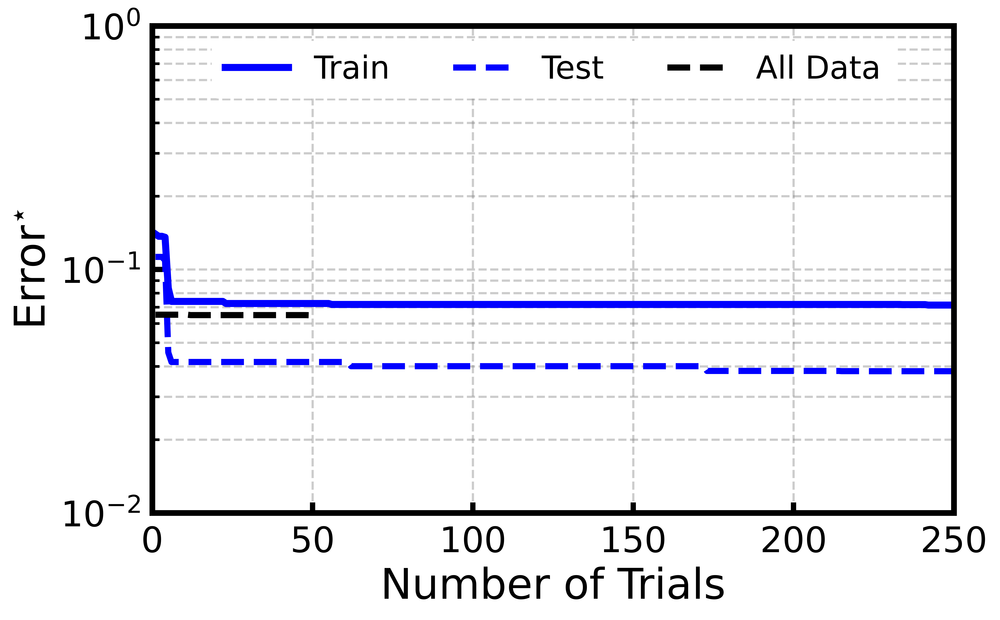

In [7]:
df_trials_ru = pd.read_csv("./Diode_ex/Final_Results_Paper/Clipped_Glitched_Train_Val_Split/diamond_diode_Optuna_250_trials_50p_glitched_train_val_split.csv")
train_error_ru = np.array(df_trials_ru['Train Error'])
test_error_ru = np.array(df_trials_ru['Test Error'])


df_trials_ru_all_data = pd.read_csv("./Diode_ex/Final_Results_Paper/Clipped_Glitched_All_Data/diamond_diode_Optuna_250_trials_all_data_50p_glitched.csv")
error_ru_all_data = np.array(df_trials_ru_all_data['Error'])


def make_array_decreasing(arr):
    return np.minimum.accumulate(arr)

train_error_ru = make_array_decreasing(train_error_ru)
test_error_ru = make_array_decreasing(test_error_ru)

error_ru_all_data = make_array_decreasing(error_ru_all_data)

num_trials = np.arange(1, 251)
num_trials_all_data = np.arange(1, 51)

fig, ax = plt.subplots(dpi=1000)

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)

plt.semilogy(num_trials, train_error_ru, color='blue', linewidth=4)
plt.semilogy(num_trials, test_error_ru, color='blue', linewidth=3.5, linestyle='--')
plt.semilogy(num_trials_all_data, error_ru_all_data, color='black', linewidth=3.5, linestyle='--')

ax.set_xlim([0, 250])  
ax.set_ylim([10**-2, 10**0])  

ax.set_xlabel('Number of Trials', fontsize=24, color='black')
ax.set_ylabel(r'Error$^{\star}$', fontsize=24, color='black')

ax.legend(['Train', 'Test', 'All Data'], fontsize=18, loc='upper center', framealpha=1, facecolor='white', edgecolor='white', ncol = 3)

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)

ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, colors='black', zorder=0)

plt.tick_params(axis='both', which='major', pad=7) 

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()

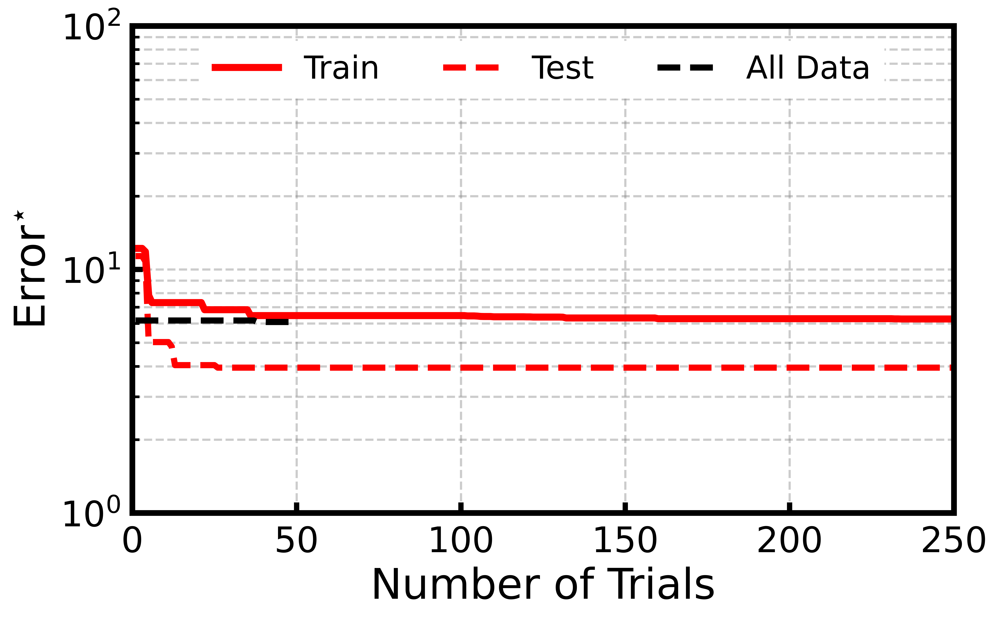

In [8]:
df_trials = pd.read_csv("./Diode_ex/Final_Results_Paper/Non_Robust_Glitched_Train_Val_Split/diamond_diode_Optuna_250_trials_50p_glitched_non_robust_train_val_split.csv")
train_error = np.array(df_trials['Train Error'])
test_error = np.array(df_trials['Test Error'])


df_trials_all_data = pd.read_csv("./Diode_ex/Final_Results_Paper/Non_Robust_Glitched_All_Data/diamond_diode_Optuna_250_trials_all_data_50p_glitched_non_robust.csv")
error_all_data = np.array(df_trials_all_data['Error'])


def make_array_decreasing(arr):
    return np.minimum.accumulate(arr)

train_error = make_array_decreasing(train_error)
test_error = make_array_decreasing(test_error)

error_all_data = make_array_decreasing(error_all_data)

num_trials = np.arange(1, 251)
num_trials_all_data = np.arange(1, 51)

fig, ax = plt.subplots(dpi=1000)

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)

plt.semilogy(num_trials, train_error, color='red', linewidth=4)
plt.semilogy(num_trials, test_error, color='red', linewidth=3.5, linestyle='--')
plt.semilogy(num_trials_all_data, error_all_data, color='black', linewidth=3.5, linestyle='--')

ax.set_xlim([0, 250])  
ax.set_ylim([10**0, 10**2])  


ax.set_xlabel('Number of Trials', fontsize=24, color='black')
ax.set_ylabel(r'Error$^{\star}$', fontsize=24, color='black')

ax.legend(['Train', 'Test', 'All Data'], fontsize=18, loc='upper center', framealpha=1, facecolor='white', edgecolor='white', ncol = 3)

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)


ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, colors='black', zorder=0)

plt.tick_params(axis='both', which='major', pad=7) 

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()

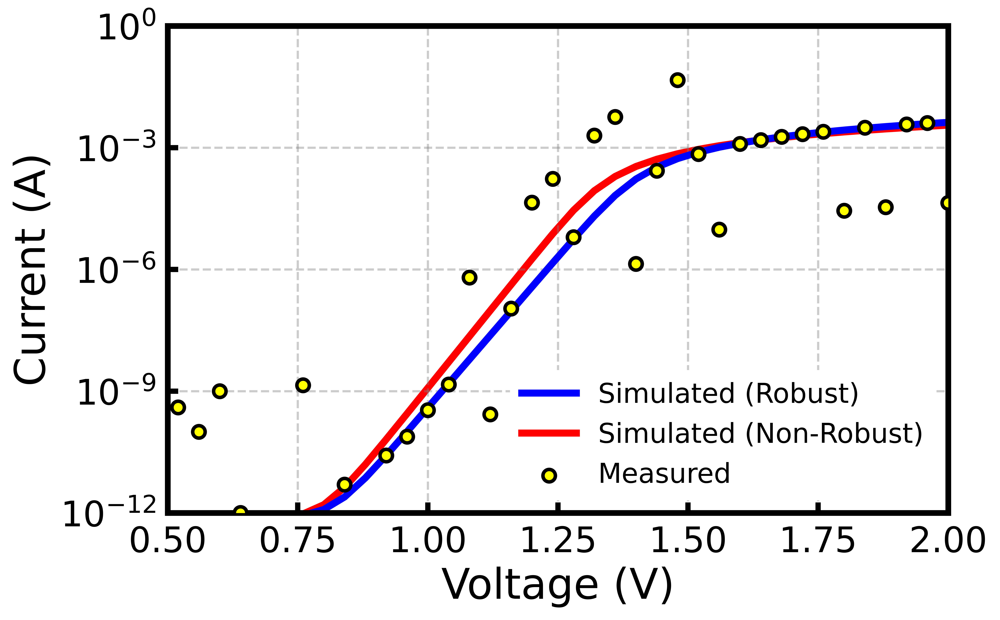

In [9]:
df_diode_meas = pd.read_csv("./Diode_ex/Final_Results_Paper/Clipped_Glitched_All_Data/diamond_diode_50p_glitched_meas.csv")
va_meas = np.array(df_diode_meas['va'])
ia_meas = np.array(df_diode_meas['ia_meas'])

df_diode_sim = pd.read_csv("./Diode_ex/Final_Results_Paper/Clipped_Glitched_All_Data/diamond_diode_sim_50p_glitched.csv")
va_sim = np.array(df_diode_sim['va_sim'])
ia_sim = np.array(df_diode_sim['ia_sim'])

df_diode_sim_nr = pd.read_csv("./Diode_ex/Final_Results_Paper/Non_Robust_Glitched_All_Data/diamond_diode_sim_50p_glitched_non_robust.csv")
va_sim_nr = np.array(df_diode_sim_nr['va_sim'])
ia_sim_nr = np.array(df_diode_sim_nr['ia_sim'])

fig, ax = plt.subplots(dpi=1000)
rcParams['font.family'] = 'Dejavu Sans'

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)

plt.scatter(va_meas, ia_meas, edgecolor='black', color='yellow', linewidth=2, s=50, zorder=3)
plt.semilogy(va_sim, ia_sim, color='blue', linewidth=4, linestyle='-', zorder=2)
plt.semilogy(va_sim_nr, ia_sim_nr, color='red', linewidth=4, linestyle='-', zorder=1)


ax.set_xlim([0.5, 2])  
ax.set_ylim([10**-12, 10**0])  

ax.set_xlabel('Voltage (V)', fontsize=24, color='black')
ax.set_ylabel(r'Current (A)', fontsize=24, color='black')

ax.legend(['Simulated (Robust)', 'Simulated (Non-Robust)', 'Measured'], fontsize=15.5, loc='best', framealpha=1, facecolor='white', edgecolor='white')

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)

ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, colors='black', zorder=0)
plt.tick_params(axis='both', which='major', pad=7) # Adjust pad for more space

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()
# fig.savefig("Fig_7.pdf", format='pdf', bbox_inches='tight')

In [10]:
df_diode_meas = pd.read_csv("./Diode_ex/Final_Results_Paper/Clipped_All_Data/diamond_diode_meas.csv")
va_meas = np.array(df_diode_meas['va_meas'])
ia_meas = np.array(df_diode_meas['ia_meas'])

df_diode_sim = pd.read_csv("./Diode_ex/Final_Results_Paper/Clipped_Glitched_All_Data/diamond_diode_sim_50p_glitched.csv")
va_sim = np.array(df_diode_sim['va_sim'])
ia_sim = np.array(df_diode_sim['ia_sim'])

df_diode_sim_nr = pd.read_csv("./Diode_ex/Final_Results_Paper/Non_Robust_Glitched_All_Data/diamond_diode_sim_50p_glitched_non_robust.csv")
va_sim_nr = np.array(df_diode_sim_nr['va_sim'])
ia_sim_nr = np.array(df_diode_sim_nr['ia_sim'])

indices_ia = np.where(ia_meas < 1e-10)[0]

# Delete the specific data points
ia_meas = np.delete(ia_meas, indices_ia)
ia_sim = np.delete(ia_sim, indices_ia)
ia_sim_nr = np.delete(ia_sim_nr, indices_ia)

epsilon = 1e-10
delta = np.sqrt(0.15)

def calc_error_robust(ia_meas, ia_sim, epsilon, delta):
    ia_meas = np.maximum(ia_meas, -epsilon + 1e-15)
    ia_sim = np.maximum(ia_sim, -epsilon + 1e-15)
    log_I_meas = np.log(1 + ia_meas/epsilon)
    log_I_sim = np.log(1 + ia_sim/epsilon)
    error = np.abs(log_I_meas - log_I_sim)
    penalized_errors = np.where(error <= delta, error**2, delta**2)
    return np.mean(penalized_errors)

def calc_error_non_robust(ia_meas, ia_sim, epsilon):
    ia_meas = np.maximum(ia_meas, -epsilon + 1e-15)
    ia_sim = np.maximum(ia_sim, -epsilon + 1e-15)
    log_I_meas = np.log(1 + ia_meas/epsilon)
    log_I_sim = np.log(1 + ia_sim/epsilon)
    error = np.abs(log_I_meas - log_I_sim)
    return np.mean(error**2)

error_ia = calc_error_robust(ia_meas, ia_sim, epsilon, delta)
error_ia_nr = calc_error_non_robust(ia_meas, ia_sim_nr, epsilon)

print('The robust error for ia for values greater than 1e-10 is:' + ' ' + str(error_ia))
print('The non-robust error for ia for values greater than 1e-10 is:' + ' ' + str(error_ia_nr))

The robust error for ia for values greater than 1e-10 is: 0.010815580544122235
The non-robust error for ia for values greater than 1e-10 is: 0.7564529775120714


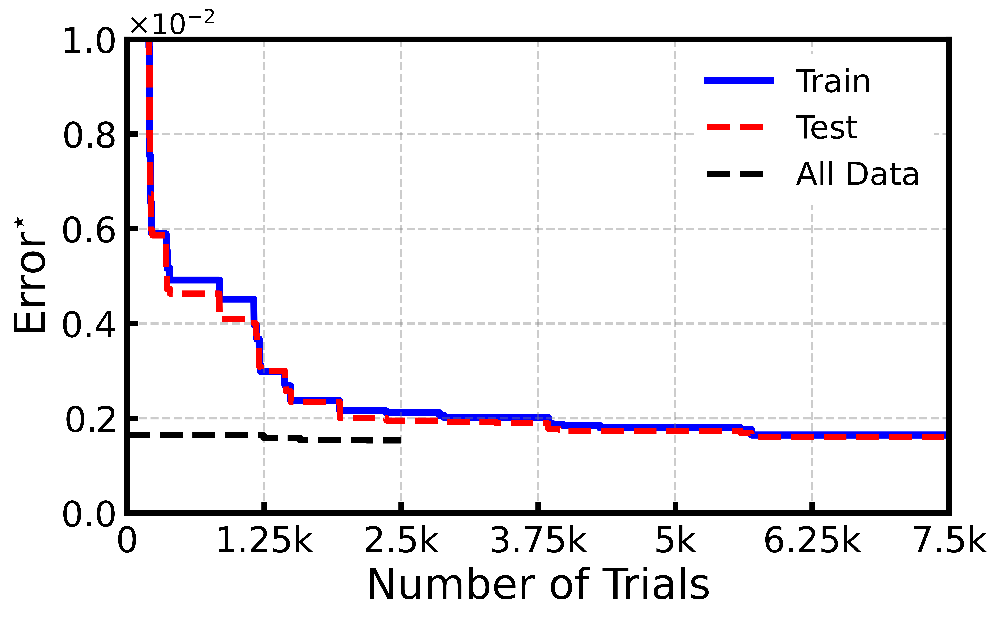

In [11]:
from matplotlib.ticker import LogFormatter
df_trials = pd.read_csv("./HEMT_EX/Final_Results_Paper/Clipped_Train_Val_Split/optuna_50id_50gm_trials_10000_singleobj_clipped.csv")
df_trials_all_data = pd.read_csv("./HEMT_EX/Final_Results_Paper/Clipped_All_Data/optuna_50id_50gm_trials_10000_singleobj_clipped_all_data.csv")

total_train_error = np.array(df_trials['total_train_error'])
total_train_error_plt = total_train_error.copy()
test_error_id = np.array(df_trials['test_error_id'])
test_error_gm = np.array(df_trials['test_error_gm'])
total_test_error = 0.5*np.array(df_trials['test_error_id']) + 0.5*np.array(df_trials['test_error_gm'])

total_error_all_data = np.array(df_trials_all_data['total_error'])

def make_array_decreasing(arr):
    return np.minimum.accumulate(arr)

train_error = make_array_decreasing(total_train_error)
test_error = make_array_decreasing(total_test_error)
error_all_data = make_array_decreasing(total_error_all_data)
num_trials = np.arange(1, 10001)
num_trials_re_train = np.arange(1, 2501)

fig, ax = plt.subplots(dpi=1000)
rcParams['font.family'] = 'Dejavu Sans'

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)

plt.plot(num_trials, train_error, color='blue', linewidth=4, zorder=1)
plt.plot(num_trials, test_error, color='red', linewidth=3.5, linestyle='--', zorder=2)
plt.plot(num_trials_re_train, error_all_data, color='black', linewidth=3.5, linestyle='--', zorder=2)

ax.set_xlim([0, 7500])  
ax.set_ylim([0, 10**-2])  

x_ticks = np.arange(0, 7501, 1250)
ax.set_xticks(x_ticks)

ax.set_xlabel('Number of Trials', fontsize=24, color='black')
ax.set_ylabel(r'Error$^{\star}$', fontsize=24, color='black')

ax.legend(['Train', 'Test', 'All Data'], fontsize=18, loc='upper right', framealpha=1, facecolor='white', edgecolor='white')

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)

def custom_formatter(x, pos):
    if x == 0:
        return '0'  
    elif x % 1000 == 0:
        return f'{int(x/1000)}k'  
    else:
        return f'{x/1000}k'  

ax.get_xaxis().set_major_formatter(ticker.FuncFormatter(custom_formatter))  # Use custom formatter

ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, colors='black', labelsize=20, zorder=0)
plt.tick_params(axis='both', which='major', pad=7) # Adjust pad for more space

ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
plt.gca().yaxis.get_offset_text().set_fontsize(16)
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

plt.gca().yaxis.get_offset_text().set_fontsize(16)

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()
# fig.savefig("Fig_8.pdf", format='pdf', bbox_inches='tight')

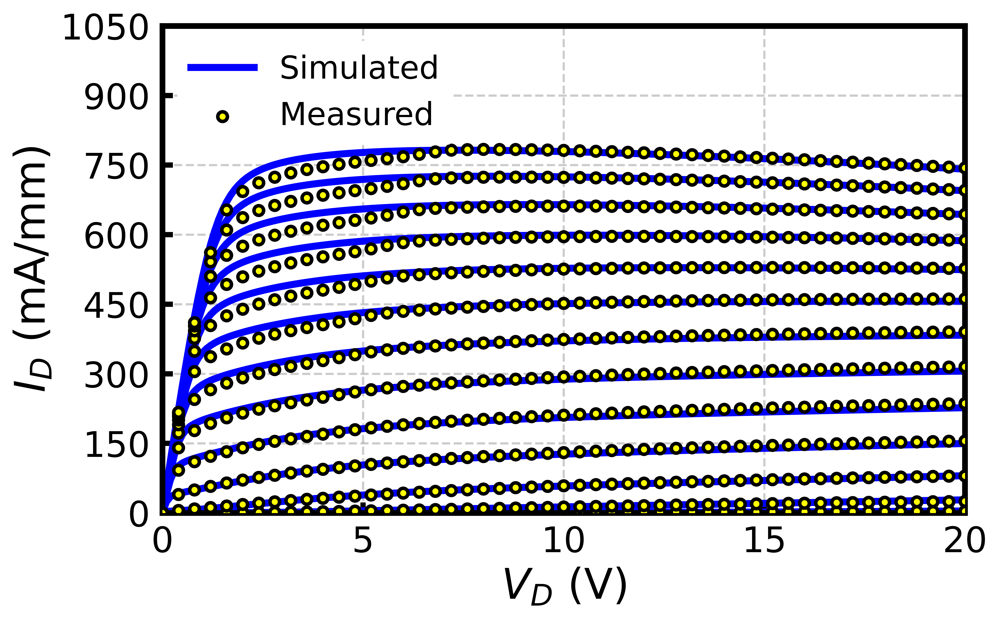

In [12]:
Area = 4*50e-6
df_HEMT_sim = pd.read_csv("./HEMT_EX/Final_Results_Paper/Clipped_All_Data/id_gm_sim_clipped_all_data.csv")

vd_sim = np.array(df_HEMT_sim['vd'])
vg_sim = np.array(df_HEMT_sim['vg'])
id_sim = np.array(df_HEMT_sim['id_sim'])/Area

df_HEMT_meas = pd.read_csv("./HEMT_EX/Final_Results_Paper/Clipped_All_Data/id_gm_meas_clipped_all_data.csv")
vd_meas = np.array(df_HEMT_meas['vd'])
vg_meas = np.array(df_HEMT_meas['vg'])
id_meas = np.array(df_HEMT_meas['id_meas'])/Area

vd_unique = np.unique(vd_meas)
vg_unique = np.unique(vg_meas)

vg_len = len(vg_unique)
vd_len = len(vd_unique)
id_meas_plt = id_meas.reshape(vd_len, vg_len, order='F')
id_sim_plt = id_sim.reshape(vd_len, vg_len, order='F')

fig, ax = plt.subplots(dpi=1000)
rcParams['font.family'] = 'Dejavu Sans'

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)

plt.plot([], [], linewidth=4, color='blue', linestyle='-', zorder=1, label='Simulated')
plt.scatter(np.array(-20), np.array(-20), color='yellow', s=30, alpha=1, edgecolor='black', linewidth=2, zorder=1, label='Measured')

for i in range(0, vg_len, 2):
    plt.plot(vd_unique, id_sim_plt[:, i + 1], linewidth=4, color='blue', linestyle='-', zorder=2)

n = 4  # Downsampling factor
for i in range(0, vg_len, 2):
    plt.scatter(vd_unique[::n], id_meas_plt[::n, i + 1], color='yellow', s=30, alpha=1, edgecolor='black', linewidth=2, zorder=3)
    
ax.set_xlim([0, 20])  
ax.set_ylim([0, 1050])  

ax.set_yticks(np.arange(0, 1050 + 150, 150))

ax.set_xlabel('$V_D$ (V)', fontsize=24, color='black')
ax.set_ylabel(r'$I_{D}$ (mA/mm)', fontsize=24, color='black')

ax.legend(fontsize=18, loc='upper left', framealpha=1, facecolor='white', edgecolor='white', ncol=1)

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)

ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, colors='black', zorder=0)
plt.tick_params(axis='both', which='major', pad=7) 

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()
# fig.savefig("Fig_9.pdf", format='pdf', bbox_inches='tight')

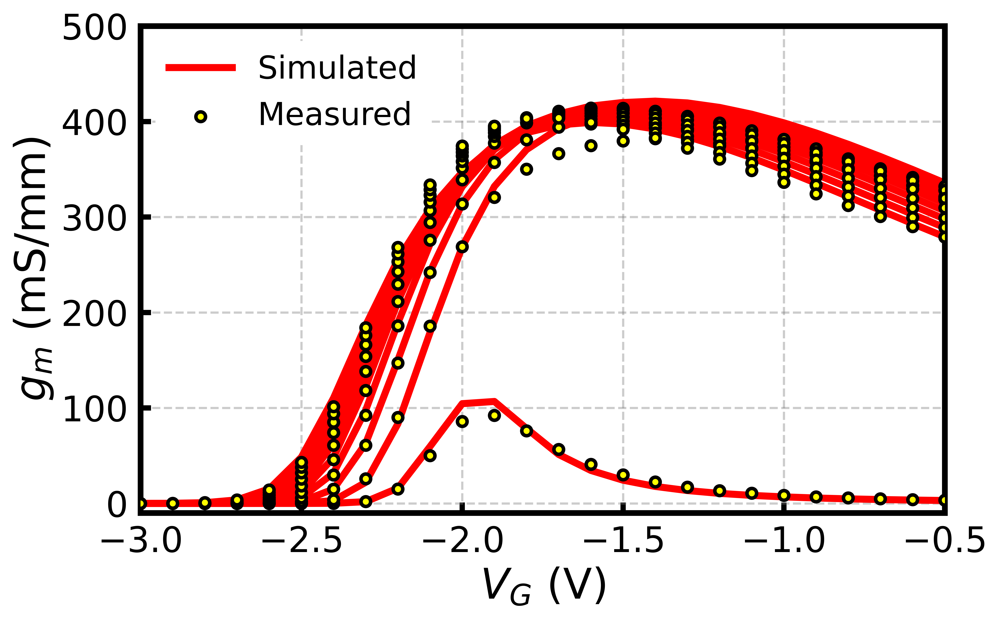

In [13]:
Area = 4*50e-6
df_HEMT_sim = pd.read_csv("./HEMT_EX/Final_Results_Paper/Clipped_All_Data/id_gm_sim_clipped_all_data.csv")

vd_sim = np.array(df_HEMT_sim['vd'])
vg_sim = np.array(df_HEMT_sim['vg'])
gm_sim = np.array(df_HEMT_sim['gm_sim'])/Area

df_HEMT_meas = pd.read_csv("./HEMT_EX/Final_Results_Paper/Clipped_All_Data/id_gm_meas_clipped_all_data.csv")
vd_meas = np.array(df_HEMT_meas['vd'])
vg_meas = np.array(df_HEMT_meas['vg'])
gm_meas = np.array(df_HEMT_meas['gm_meas'])/Area

vd_unique = np.unique(vd_meas)
vg_unique = np.unique(vg_meas)

vg_len = len(vg_unique)
vd_len = len(vd_unique)
gm_meas_plt = gm_meas.reshape(vd_len, vg_len, order='F')
gm_sim_plt = gm_sim.reshape(vd_len, vg_len, order='F')

fig, ax = plt.subplots(dpi=1000)

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)

plt.plot([], [], linewidth=4, color='red', linestyle='-', zorder=1, label='Simulated')
plt.scatter(np.array(-20), np.array(-20), color='yellow', s=30, alpha=1, edgecolor='black', linewidth=2, zorder=1, label='Measured')

for i in range(1, vd_len - 10, 20):
    plt.plot(vg_unique, gm_sim_plt[i, :], linewidth=4, color='red', linestyle='-', zorder=2)
for i in range(1, vd_len - 10, 20):
    plt.scatter(vg_unique, gm_meas_plt[i,:], color='yellow', s=30, alpha=1, edgecolor='black', linewidth=2, zorder=3)
#     print(vd_unique[i]) 
    
ax.set_xlim([-3, -0.5])  
ax.set_ylim([-10, 500])  

ax.set_xlabel('$V_G$ (V)', fontsize=24, color='black')
ax.set_ylabel(r'$g_m$ (mS/mm)', fontsize=24, color='black')

ax.legend(fontsize=18, loc='upper left', framealpha=1, facecolor='white', edgecolor='white', ncol = 1)

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)

ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, colors='black', zorder=0)
plt.tick_params(axis='both', which='major', pad=7) # Adjust pad for more space

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()
# fig.savefig("Fig_10.pdf", format='pdf', bbox_inches='tight')

In [14]:
df_HEMT_sim = pd.read_csv("./HEMT_EX/Final_Results_Paper/Clipped_All_Data/id_gm_sim_clipped_all_data.csv")

vd_sim = np.array(df_HEMT_sim['vd'])
vg_sim = np.array(df_HEMT_sim['vg'])
id_sim = np.array(df_HEMT_sim['id_sim'])
gm_sim = np.array(df_HEMT_sim['gm_sim'])

df_HEMT_meas = pd.read_csv("./HEMT_EX/Final_Results_Paper/Clipped_All_Data/id_gm_meas_clipped_all_data.csv")

vd_meas = np.array(df_HEMT_meas['vd'])
vg_meas = np.array(df_HEMT_meas['vg'])
id_meas = np.array(df_HEMT_meas['id_meas'])
gm_meas = np.array(df_HEMT_meas['gm_meas'])

indices_id = np.where(id_meas < 1e-4)[0]
indices_gm = np.where(gm_meas < 1e-3)[0]

id_meas = np.delete(id_meas, indices_id)
id_sim = np.delete(id_sim, indices_id)

gm_meas = np.delete(gm_meas, indices_gm)
gm_sim = np.delete(gm_sim, indices_gm)

epsilon_id = 1e-4
epsilon_gm = 1e-3
delta = np.sqrt(0.15)

def calc_error(ia_meas, ia_sim, epsilon, delta):
    ia_meas = np.maximum(ia_meas, -epsilon + 1e-15)
    ia_sim = np.maximum(ia_sim, -epsilon + 1e-15)
    log_I_meas = np.log(1 + ia_meas/epsilon)
    log_I_sim = np.log(1 + ia_sim/epsilon)
    error = np.abs(log_I_meas - log_I_sim)
    penalized_errors = np.where(error <= delta, error**2, delta**2)
    return np.mean(penalized_errors)

error_id = calc_error(id_meas, id_sim, epsilon_id, delta)
error_gm = calc_error(gm_meas, gm_sim, epsilon_gm, delta)
total_error_id_gm = 0.5*error_id + 0.5*error_gm

print('The error for ID for values greater than 1e-4 is:' + ' ' + str(error_id))
print('The error for gm for values greater than 1e-3 is:' + ' ' + str(error_gm))
print('The total error for id and gm for values greater than 1e-4 and 1e-3, respectively, is:' + ' ' + str(total_error_id_gm))

The error for ID for values greater than 1e-4 is: 0.0012521364507281578
The error for gm for values greater than 1e-3 is: 0.0021704878863630546
The total error for id and gm for values greater than 1e-4 and 1e-3, respectively, is: 0.0017113121685456063


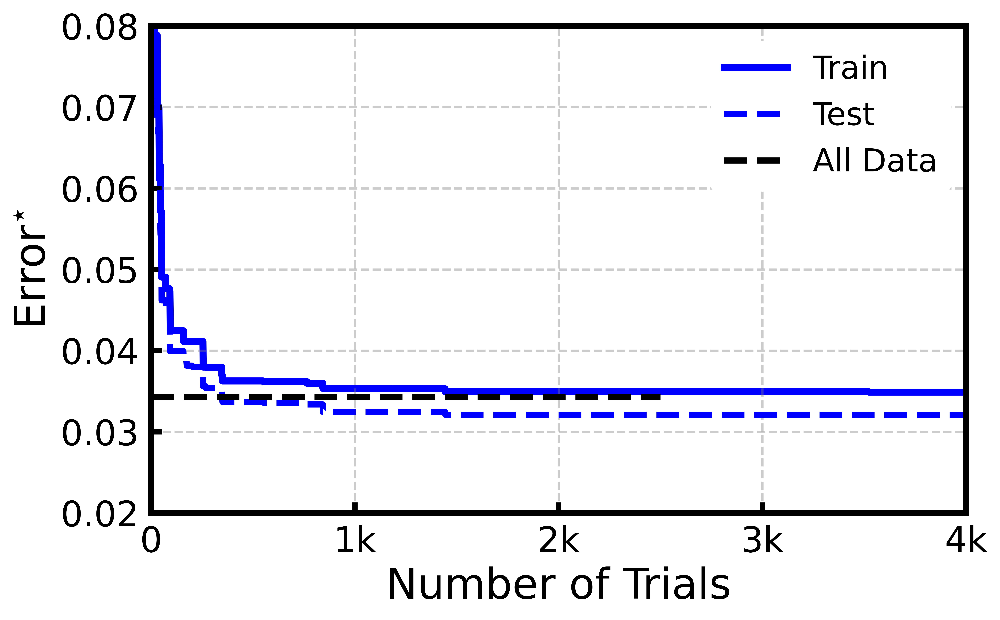

In [15]:
df_trials = pd.read_csv("./HEMT_ex/Final_Results_Paper/Clipped_Glitched_Train_Test_Split/optuna_50id_50gm_trials_10000_singleobj_clipped_25p_glitched.csv")
total_train_error = np.array(df_trials['total_train_error'])
total_train_error_plt = total_train_error.copy()
test_error_id = np.array(df_trials['test_error_id'])
test_error_gm = np.array(df_trials['test_error_gm'])
total_test_error = 0.5*np.array(df_trials['test_error_id']) + 0.5*np.array(df_trials['test_error_gm'])

df_trials_all_data = pd.read_csv("./HEMT_ex/Final_Results_Paper/Clipped_Glitched_All_Data/optuna_50id_50gm_trials_10000_singleobj_clipped_25p_glitched_all_data.csv")

total_error_all_data = np.array(df_trials_all_data['total_error'])


def make_array_decreasing(arr):
    return np.minimum.accumulate(arr)

train_error = make_array_decreasing(total_train_error)
test_error = make_array_decreasing(total_test_error)
total_error_all_data = make_array_decreasing(total_error_all_data)

num_trials = np.arange(1, 10001)
num_trials_all_data = np.arange(1, 2501)

fig, ax = plt.subplots(dpi=1000)
rcParams['font.family'] = 'Dejavu Sans'

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)

plt.plot(num_trials, train_error, color='blue', linewidth=4, zorder=1)
plt.plot(num_trials, test_error, color='blue', linewidth=3.5, linestyle='--', zorder=2)

plt.plot(num_trials_all_data, total_error_all_data, color='black', linewidth=3.5, linestyle='--', zorder=3)

ax.set_xlim([0, 4000])  
ax.set_ylim([0.02, 0.08])  

ax.set_xlabel('Number of Trials', fontsize=24, color='black')
ax.set_ylabel(r'Error$^{\star}$', fontsize=24, color='black')

ax.legend(['Train', 'Test', 'All Data'], fontsize=18, loc='best', framealpha=1, facecolor='white', edgecolor='white', ncol=1)

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)

def custom_formatter(x, pos):
    if x == 0:
        return '0'  
    elif x % 1000 == 0:
        return f'{int(x/1000)}k'  
    else:
        return f'{x/1000}k'  

ax.get_xaxis().set_major_formatter(ticker.FuncFormatter(custom_formatter))  

ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=2.25, colors='black', zorder=0)
plt.tick_params(axis='both', which='major', pad=7) 

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()
# fig.savefig("Fig_11a.pdf", format='pdf', bbox_inches='tight')


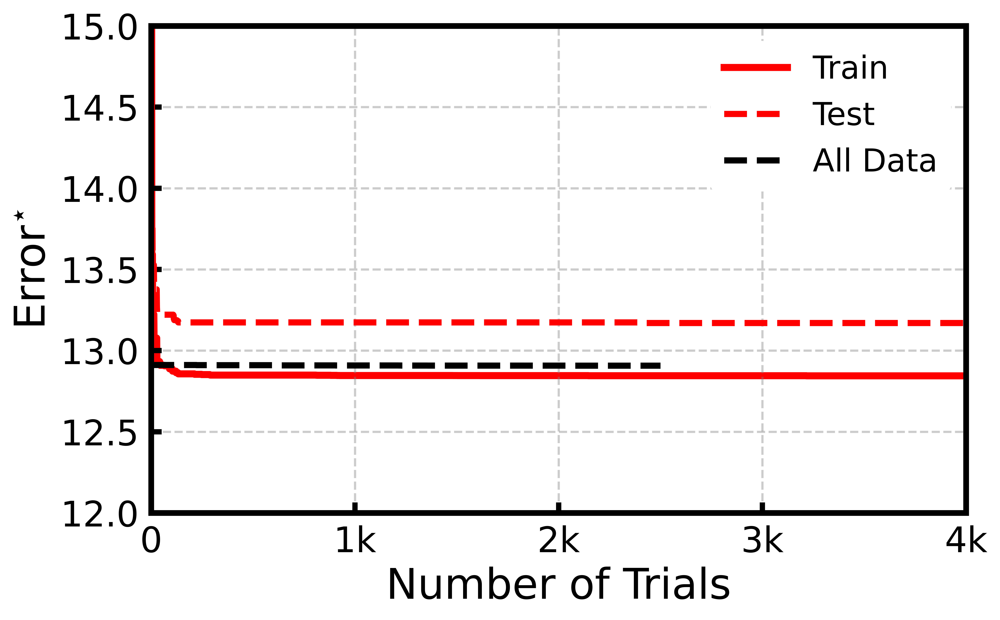

In [16]:
df_trials = pd.read_csv("./HEMT_ex/Final_Results_Paper/Non-Robust_Glitched_Train_Test_Split/optuna_50id_50gm_trials_10000_singleobj_clipped_25p_glitched.csv")
total_train_error = np.array(df_trials['total_train_error'])
total_train_error_plt = total_train_error.copy()
test_error_id = np.array(df_trials['test_error_id'])
test_error_gm = np.array(df_trials['test_error_gm'])
total_test_error = 0.5*np.array(df_trials['test_error_id']) + 0.5*np.array(df_trials['test_error_gm'])

df_trials_all_data = pd.read_csv("./HEMT_ex/Final_Results_Paper/Non-Robust_Glitched_All_Data/optuna_50id_50gm_trials_10000_singleobj_non_robust_25p_glitched_all_data.csv")

total_error_all_data = np.array(df_trials_all_data['total_error'])

def make_array_decreasing(arr):
    return np.minimum.accumulate(arr)

train_error = make_array_decreasing(total_train_error)
test_error = make_array_decreasing(total_test_error)
total_error_all_data = make_array_decreasing(total_error_all_data)

num_trials = np.arange(1, 10001)
num_trials_all_data = np.arange(1, 2501)

fig, ax = plt.subplots(dpi=1000)
rcParams['font.family'] = 'Dejavu Sans'

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)

plt.plot(num_trials, train_error, color='red', linewidth=4, zorder=1)
plt.plot(num_trials, test_error, color='red', linewidth=3.5, linestyle='--', zorder=2)

plt.plot(num_trials_all_data, total_error_all_data, color='black', linewidth=3.5, linestyle='--', zorder=3)

ax.set_xlim([0, 4000])  
ax.set_ylim([12, 15])  

ax.set_xlabel('Number of Trials', fontsize=24, color='black')
ax.set_ylabel(r'Error$^{\star}$', fontsize=24, color='black')

ax.legend(['Train', 'Test', 'All Data'], fontsize=18, loc='best', framealpha=1, facecolor='white', edgecolor='white', ncol=1)

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)

def custom_formatter(x, pos):
    if x == 0:
        return '0'  
    elif x % 1000 == 0:
        return f'{int(x/1000)}k'  
    else:
        return f'{x/1000}k'  

ax.get_xaxis().set_major_formatter(ticker.FuncFormatter(custom_formatter)) 

ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=2.25, colors='black', zorder=0)
plt.tick_params(axis='both', which='major', pad=7) # Adjust pad for more space

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()
# fig.savefig("Fig_11b.pdf", format='pdf', bbox_inches='tight')

<ipython-input-17-32fbcc6d1d88>:38: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.semilogy(vd_unique, abs(id_sim_plt_nr[:, i + 1]), linewidth=4, color='red', linestyle='-', zorder=1)


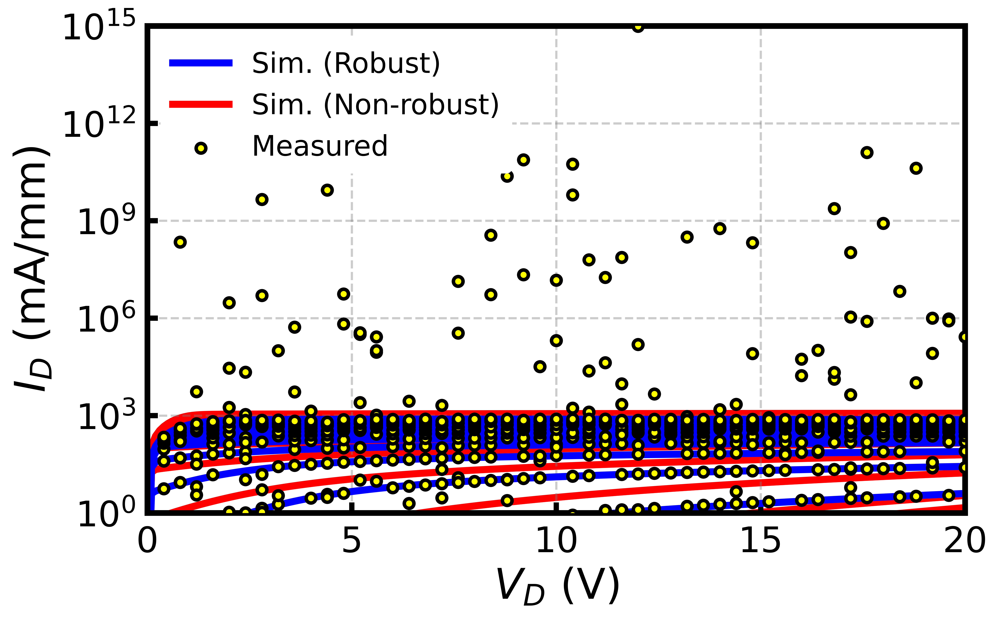

In [17]:
Area = 4*50e-6

df_HEMT_sim = pd.read_csv("./HEMT_ex/Final_Results_Paper/Clipped_Glitched_All_Data/id_gm_sim_clipped_25p_glitched_all_data.csv")
vd_sim = np.array(df_HEMT_sim['vd'])
vg_sim = np.array(df_HEMT_sim['vg'])
id_sim = np.array(df_HEMT_sim['id_sim'])/Area

df_HEMT_sim_nr = pd.read_csv("./HEMT_ex/Final_Results_Paper/Non-Robust_Glitched_All_Data/id_gm_sim_non_robust_25p_glitched_all_data.csv")
vd_sim_nr = np.array(df_HEMT_sim_nr['vd'])
vg_sim_nr = np.array(df_HEMT_sim_nr['vg'])
id_sim_nr = np.array(df_HEMT_sim_nr['id_sim'])/Area

df_HEMT_meas = pd.read_csv("./HEMT_ex/Final_Results_Paper/Clipped_Glitched_All_Data/id_gm_meas_clipped_all_data.csv")
vd_meas = np.array(df_HEMT_meas['vd'])
vg_meas = np.array(df_HEMT_meas['vg'])
id_meas = np.array(df_HEMT_meas['id_meas'])/Area

vd_unique = np.unique(vd_meas)
vg_unique = np.unique(vg_meas)

vg_len = len(vg_unique)
vd_len = len(vd_unique)
id_meas_plt = id_meas.reshape(vd_len, vg_len, order='F')
id_sim_plt = id_sim.reshape(vd_len, vg_len, order='F')
id_sim_plt_nr = id_sim_nr.reshape(vd_len, vg_len, order='F')

fig, ax = plt.subplots(dpi=1000)
rcParams['font.family'] = 'Dejavu Sans'

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)

plt.plot([], [], linewidth=4, color='blue', linestyle='-', zorder=1, label='Sim. (Robust)')
plt.plot([], [], linewidth=4, color='red', linestyle='-', zorder=1, label='Sim. (Non-robust)')
plt.scatter(np.array(-20), np.array(-20), color='yellow', s=30, alpha=1, edgecolor='black', linewidth=2, zorder=1, label='Measured')

# Plotting
for i in range(0, vg_len, 2):
    plt.semilogy(vd_unique, abs(id_sim_plt_nr[:, i + 1]), linewidth=4, color='red', linestyle='-', zorder=1)
for i in range(0, vg_len, 2):
    plt.semilogy(vd_unique, abs(id_sim_plt[:, i + 1]), linewidth=4, color='blue', linestyle='-', zorder=2)
    
n = 4  
for i in range(0, vg_len, 2):
    plt.scatter(vd_unique[::n], abs(id_meas_plt[::n, i + 1]), color='yellow', s=30, alpha=1, edgecolor='black', linewidth=2, zorder=3)

    
ax.set_xlim([0, 20])  
ax.set_yticks([10**0, 10**3, 10**6, 10**9, 10**12, 10**15])

ax.set_ylim([10**0, 10**15])  

ax.set_xlabel('$V_D$ (V)', fontsize=24, color='black')
ax.set_ylabel(r'$I_{D}$ (mA/mm)', fontsize=24, color='black')

ax.legend(fontsize=16, loc='upper left', framealpha=1, facecolor='white', edgecolor='white', ncol=1)

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)

ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, colors='black', zorder=0)
plt.tick_params(axis='both', which='major', pad=7) 

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()
# fig.savefig("Fig_12.pdf", format='pdf', bbox_inches='tight')

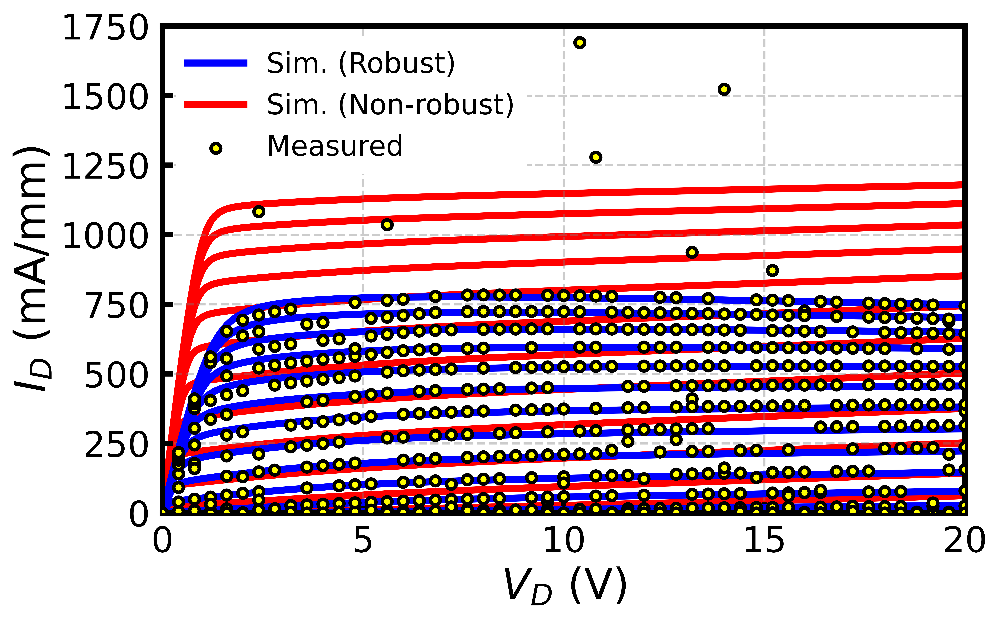

In [18]:
Area = 4*50e-6

df_HEMT_sim = pd.read_csv("./HEMT_ex/Final_Results_Paper/Clipped_Glitched_All_Data/id_gm_sim_clipped_25p_glitched_all_data.csv")
vd_sim = np.array(df_HEMT_sim['vd'])
vg_sim = np.array(df_HEMT_sim['vg'])
id_sim = np.array(df_HEMT_sim['id_sim'])/Area

df_HEMT_sim_nr = pd.read_csv("./HEMT_ex/Final_Results_Paper/Non-Robust_Glitched_All_Data/id_gm_sim_non_robust_25p_glitched_all_data.csv")
vd_sim_nr = np.array(df_HEMT_sim_nr['vd'])
vg_sim_nr = np.array(df_HEMT_sim_nr['vg'])
id_sim_nr = np.array(df_HEMT_sim_nr['id_sim'])/Area

df_HEMT_meas = pd.read_csv("./HEMT_ex/Final_Results_Paper/Clipped_Glitched_All_Data/id_gm_meas_clipped_all_data.csv")
vd_meas = np.array(df_HEMT_meas['vd'])
vg_meas = np.array(df_HEMT_meas['vg'])
id_meas = np.array(df_HEMT_meas['id_meas'])/Area

vd_unique = np.unique(vd_meas)
vg_unique = np.unique(vg_meas)

vg_len = len(vg_unique)
vd_len = len(vd_unique)
id_meas_plt = id_meas.reshape(vd_len, vg_len, order='F')
id_sim_plt = id_sim.reshape(vd_len, vg_len, order='F')
id_sim_plt_nr = id_sim_nr.reshape(vd_len, vg_len, order='F')

fig, ax = plt.subplots(dpi=1000)
rcParams['font.family'] = 'Dejavu Sans'

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)

plt.plot([], [], linewidth=4, color='blue', linestyle='-', zorder=1, label='Sim. (Robust)')
plt.plot([], [], linewidth=4, color='red', linestyle='-', zorder=1, label='Sim. (Non-robust)')
plt.scatter(np.array(-20), np.array(-20), color='yellow', s=30, alpha=1, edgecolor='black', linewidth=2, zorder=1, label='Measured')

for i in range(0, vg_len, 2):
    plt.plot(vd_unique, id_sim_plt_nr[:, i + 1], linewidth=4, color='red', linestyle='-', zorder=1)
for i in range(0, vg_len, 2):
    plt.plot(vd_unique, abs(id_sim_plt[:, i + 1]), linewidth=4, color='blue', linestyle='-', zorder=2)
    
n = 4  
for i in range(0, vg_len, 2):
    plt.scatter(vd_unique[::n], id_meas_plt[::n, i + 1], color='yellow', s=30, alpha=1, edgecolor='black', linewidth=2, zorder=3)
    
ax.set_xlim([0, 20])  
ax.set_ylim([0, 1750])  

ax.set_yticks(np.arange(0, 1750 + 250, 250))

ax.set_xlabel('$V_D$ (V)', fontsize=24, color='black')
ax.set_ylabel(r'$I_{D}$ (mA/mm)', fontsize=24, color='black')

ax.legend(fontsize=16, loc='upper left', framealpha=1, facecolor='white', edgecolor='white', ncol=1)

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)

ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, colors='black', zorder=0)
plt.tick_params(axis='both', which='major', pad=7) 

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()
# fig.savefig("Fig_13.pdf", format='pdf', bbox_inches='tight')

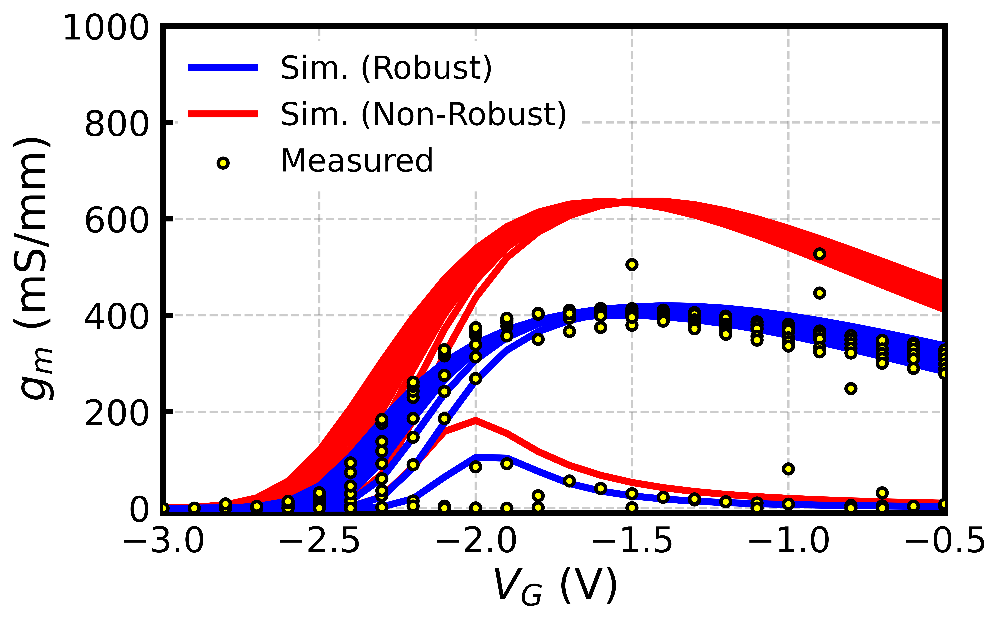

In [19]:
Area = 4*50e-6

df_HEMT_sim = pd.read_csv("./HEMT_ex/Final_Results_Paper/Clipped_Glitched_All_Data/id_gm_sim_clipped_25p_glitched_all_data.csv")
vd_sim = np.array(df_HEMT_sim['vd'])
vg_sim = np.array(df_HEMT_sim['vg'])
gm_sim = np.array(df_HEMT_sim['gm_sim'])/Area

df_HEMT_sim_nr = pd.read_csv("./HEMT_ex/Final_Results_Paper/Non-Robust_Glitched_All_Data/id_gm_sim_non_robust_25p_glitched_all_data.csv")
vd_sim_nr = np.array(df_HEMT_sim_nr['vd'])
vg_sim_nr = np.array(df_HEMT_sim_nr['vg'])
gm_sim_nr = np.array(df_HEMT_sim_nr['gm_sim'])/Area

df_HEMT_meas = pd.read_csv("./HEMT_ex/Final_Results_Paper/Clipped_Glitched_All_Data/id_gm_meas_clipped_all_data.csv")
vd_meas = np.array(df_HEMT_meas['vd'])
vg_meas = np.array(df_HEMT_meas['vg'])
gm_meas = np.array(df_HEMT_meas['gm_meas'])/Area

vd_unique = np.unique(vd_meas)
vg_unique = np.unique(vg_meas)

vg_len = len(vg_unique)
vd_len = len(vd_unique)
gm_meas_plt = gm_meas.reshape(vd_len, vg_len, order='F')
gm_sim_plt = gm_sim.reshape(vd_len, vg_len, order='F')
gm_sim_plt_nr = gm_sim_nr.reshape(vd_len, vg_len, order='F')

fig, ax = plt.subplots(dpi=1000)

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)

plt.plot([], [], linewidth=4, color='blue', linestyle='-', zorder=1, label='Sim. (Robust)')
plt.plot([], [], linewidth=4, color='red', linestyle='-', zorder=1, label='Sim. (Non-Robust)')
plt.scatter(np.array(-20), np.array(-20), color='yellow', s=30, alpha=1, edgecolor='black', linewidth=2, zorder=1, label='Measured')

for i in range(1, vd_len - 10, 20):
    plt.plot(vg_unique, gm_sim_plt[i, :], linewidth=4, color='blue', linestyle='-', zorder=3)
    
for i in range(1, vd_len - 10, 20):
    plt.plot(vg_unique, gm_sim_plt_nr[i, :], linewidth=4, color='red', linestyle='-', zorder=2)
    
for i in range(1, vd_len - 10, 20):
    plt.scatter(vg_unique, gm_meas_plt[i,:], color='yellow', s=30, alpha=1, edgecolor='black', linewidth=2, zorder=4)
#     print(vd_unique[i]) 
    
ax.set_xlim([-3, -0.5])  
ax.set_ylim([-10, 1000])  

ax.set_xlabel('$V_G$ (V)', fontsize=24, color='black')
ax.set_ylabel(r'$g_m$ (mS/mm)', fontsize=24, color='black')

ax.legend(fontsize=18, loc='upper left', framealpha=1, facecolor='white', edgecolor='white', ncol = 1)

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)

ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, colors='black', zorder=0)
plt.tick_params(axis='both', which='major', pad=7) # Adjust pad for more space

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()

<ipython-input-20-e4c1a8f865e6>:36: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  plt.semilogy(vg_unique, abs(gm_sim_plt[i, :]), linewidth=4, color='blue', linestyle='-', zorder=3)


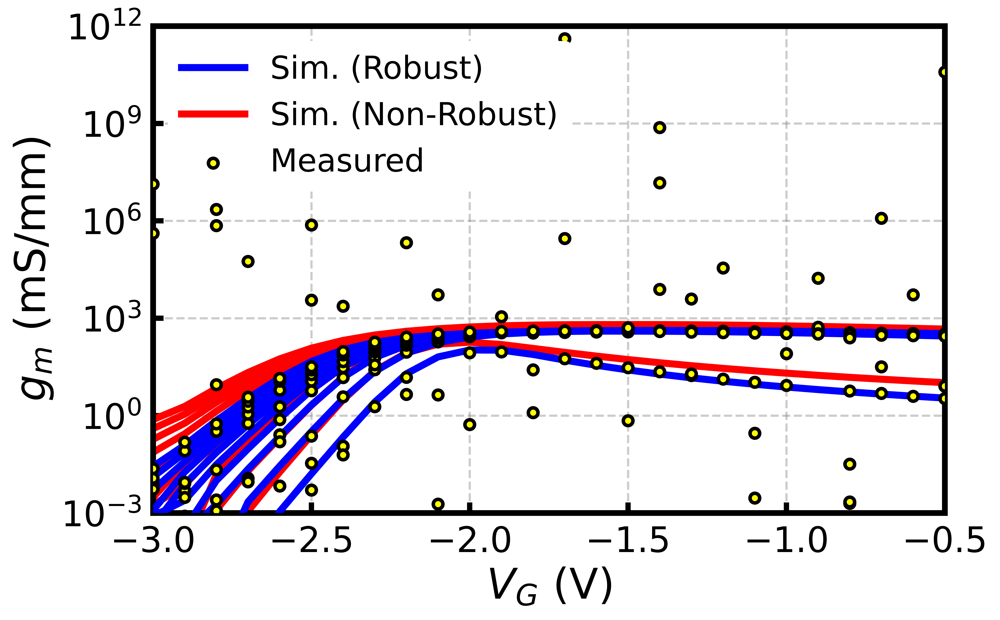

In [20]:
Area = 4*50e-6

df_HEMT_sim = pd.read_csv("./HEMT_ex/Final_Results_Paper/Clipped_Glitched_All_Data/id_gm_sim_clipped_25p_glitched_all_data.csv")
vd_sim = np.array(df_HEMT_sim['vd'])
vg_sim = np.array(df_HEMT_sim['vg'])
gm_sim = np.array(df_HEMT_sim['gm_sim'])/Area

df_HEMT_sim_nr = pd.read_csv("./HEMT_ex/Final_Results_Paper/Non-Robust_Glitched_All_Data/id_gm_sim_non_robust_25p_glitched_all_data.csv")
vd_sim_nr = np.array(df_HEMT_sim_nr['vd'])
vg_sim_nr = np.array(df_HEMT_sim_nr['vg'])
gm_sim_nr = np.array(df_HEMT_sim_nr['gm_sim'])/Area

df_HEMT_meas = pd.read_csv("./HEMT_ex/Final_Results_Paper/Clipped_Glitched_All_Data/id_gm_meas_clipped_all_data.csv")
vd_meas = np.array(df_HEMT_meas['vd'])
vg_meas = np.array(df_HEMT_meas['vg'])
gm_meas = np.array(df_HEMT_meas['gm_meas'])/Area

vd_unique = np.unique(vd_meas)
vg_unique = np.unique(vg_meas)

vg_len = len(vg_unique)
vd_len = len(vd_unique)
gm_meas_plt = gm_meas.reshape(vd_len, vg_len, order='F')
gm_sim_plt = gm_sim.reshape(vd_len, vg_len, order='F')
gm_sim_plt_nr = gm_sim_nr.reshape(vd_len, vg_len, order='F')

fig, ax = plt.subplots(dpi=1000)

ax.grid(True, which='both', color='grey', linestyle='--', linewidth=1.25, zorder=0, alpha=0.4)

plt.plot([], [], linewidth=4, color='blue', linestyle='-', zorder=1, label='Sim. (Robust)')
plt.plot([], [], linewidth=4, color='red', linestyle='-', zorder=1, label='Sim. (Non-Robust)')
plt.scatter(np.array(-20), np.array(-20), color='yellow', s=30, alpha=1, edgecolor='black', linewidth=2, zorder=1, label='Measured')

for i in range(1, vd_len - 10, 20):
    plt.semilogy(vg_unique, abs(gm_sim_plt[i, :]), linewidth=4, color='blue', linestyle='-', zorder=3)
    
for i in range(1, vd_len - 10, 20):
    plt.plot(vg_unique, abs(gm_sim_plt_nr[i, :]), linewidth=4, color='red', linestyle='-', zorder=2)
    
for i in range(1, vd_len - 10, 20):
    plt.scatter(vg_unique, abs(gm_meas_plt[i,:]), color='yellow', s=30, alpha=1, edgecolor='black', linewidth=2, zorder=4)
#     print(vd_unique[i]) 
    
ax.set_xlim([-3, -0.5])  
ax.set_ylim([10**-3, 10**12])  

ax.set_xlabel('$V_G$ (V)', fontsize=24, color='black')
ax.set_ylabel(r'$g_m$ (mS/mm)', fontsize=24, color='black')

ax.legend(fontsize=18, loc='upper left', framealpha=1, facecolor='white', edgecolor='white', ncol = 1)

line_width = 3.25
ax.spines['bottom'].set_linewidth(line_width)
ax.spines['left'].set_linewidth(line_width)
ax.spines['top'].set_linewidth(line_width)
ax.spines['right'].set_linewidth(line_width)

ax.xaxis.set_tick_params(width=1, labelsize=20)
ax.yaxis.set_tick_params(width=1, labelsize=20)

ax.tick_params(axis='both', which='major', direction='in', length=6, width=3, colors='black', labelsize=20, zorder=0)
ax.tick_params(axis='both', which='minor', direction='in', length=4, width=1.5, colors='black', zorder=0)
plt.tick_params(axis='both', which='major', pad=7) # Adjust pad for more space

fig.set_size_inches(8, 5)

plt.tight_layout()

plt.show()

In [21]:
df_HEMT_sim = pd.read_csv("./HEMT_ex/Final_Results_Paper/Clipped_Glitched_All_Data/id_gm_sim_clipped_25p_glitched_all_data.csv")
vd_sim = np.array(df_HEMT_sim['vd'])
vg_sim = np.array(df_HEMT_sim['vg'])
id_sim = np.array(df_HEMT_sim['id_sim'])
gm_sim = np.array(df_HEMT_sim['gm_sim'])

df_HEMT_meas =pd.read_csv("./HEMT_ex/Final_Results_Paper/Clipped_All_Data/id_gm_meas_clipped_all_data.csv")

vd_meas = np.array(df_HEMT_meas['vd'])
vg_meas = np.array(df_HEMT_meas['vg'])
id_meas = np.array(df_HEMT_meas['id_meas'])
gm_meas = np.array(df_HEMT_meas['gm_meas'])

indices_id = np.where(id_meas < 1e-4)[0]
indices_gm = np.where(gm_meas < 1e-3)[0]

id_meas = np.delete(id_meas, indices_id)
id_sim = np.delete(id_sim, indices_id)

gm_meas = np.delete(gm_meas, indices_gm)
gm_sim = np.delete(gm_sim, indices_gm)

epsilon_id = 1e-4
epsilon_gm = 1e-3
delta = np.sqrt(0.15)

def calc_error(ia_meas, ia_sim, epsilon, delta):
    ia_meas = np.maximum(ia_meas, -epsilon + 1e-15)
    ia_sim = np.maximum(ia_sim, -epsilon + 1e-15)
    log_I_meas = np.log(1 + ia_meas/epsilon)
    log_I_sim = np.log(1 + ia_sim/epsilon)
    error = np.abs(log_I_meas - log_I_sim)
    penalized_errors = np.where(error <= delta, error**2, delta**2)
    return np.mean(penalized_errors)

error_id = calc_error(id_meas, id_sim, epsilon_id, delta)
error_gm = calc_error(gm_meas, gm_sim, epsilon_gm, delta)
total_error_id_gm = 0.5*error_id + 0.5*error_gm

print('The error for ID for values greater than 1e-4 is:' + ' ' + str(error_id))
print('The error for gm for values greater than 1e-3 is:' + ' ' + str(error_gm))
print('The total error for id and gm for values greater than 1e-4 and 1e-3, respectively, is:' + ' ' + str(total_error_id_gm))

The error for ID for values greater than 1e-4 is: 0.0012737420860927258
The error for gm for values greater than 1e-3 is: 0.0025341401800081037
The total error for id and gm for values greater than 1e-4 and 1e-3, respectively, is: 0.0019039411330504148


In [22]:
df_HEMT_sim =pd.read_csv("./HEMT_ex/Final_Results_Paper/Non-Robust_Glitched_All_Data/id_gm_sim_non_robust_25p_glitched_all_data.csv")
vd_sim = np.array(df_HEMT_sim['vd'])
vg_sim = np.array(df_HEMT_sim['vg'])
id_sim = np.array(df_HEMT_sim['id_sim'])
gm_sim = np.array(df_HEMT_sim['gm_sim'])

df_HEMT_meas =pd.read_csv("./HEMT_ex/Final_Results_Paper/Clipped_All_Data/id_gm_meas_clipped_all_data.csv")

vd_meas = np.array(df_HEMT_meas['vd'])
vg_meas = np.array(df_HEMT_meas['vg'])
id_meas = np.array(df_HEMT_meas['id_meas'])
gm_meas = np.array(df_HEMT_meas['gm_meas'])

indices_id = np.where(id_meas < 1e-4)[0]
indices_gm = np.where(gm_meas < 1e-3)[0]

id_meas = np.delete(id_meas, indices_id)
id_sim = np.delete(id_sim, indices_id)

gm_meas = np.delete(gm_meas, indices_gm)
gm_sim = np.delete(gm_sim, indices_gm)

epsilon_id = 1e-4
epsilon_gm = 1e-3
delta = np.sqrt(0.15)

def calc_error(ia_meas, ia_sim, epsilon):
    ia_meas = np.maximum(ia_meas, -epsilon + 1e-15)
    ia_sim = np.maximum(ia_sim, -epsilon + 1e-15)
    log_I_meas = np.log(1 + ia_meas/epsilon)
    log_I_sim = np.log(1 + ia_sim/epsilon)
    error = np.abs(log_I_meas - log_I_sim)
    return np.mean(error**2)

error_id = calc_error(id_meas, id_sim, epsilon_id)
error_gm = calc_error(gm_meas, gm_sim, epsilon_gm)
total_error_id_gm = 0.5*error_id + 0.5*error_gm

print('The error for ID for values greater than 1e-4 is:' + ' ' + str(error_id))
print('The error for gm for values greater than 1e-3 is:' + ' ' + str(error_gm))
print('The total error for id and gm for values greater than 1e-4 and 1e-3, respectively, is:' + ' ' + str(total_error_id_gm))

The error for ID for values greater than 1e-4 is: 0.3251999697253018
The error for gm for values greater than 1e-3 is: 0.2384318208072678
The total error for id and gm for values greater than 1e-4 and 1e-3, respectively, is: 0.2818158952662848
